# Исследование надёжности заёмщиков

Нужно разобраться, влияет ли семейное положение и количество детей клиента на факт погашения кредита в срок. Входные данные от банка — статистика о платёжеспособности клиентов.

Результаты исследования будут учтены при построении модели кредитного скоринга — специальной системы, которая оценивает способность потенциального заёмщика вернуть кредит банку.

План работы:
1. [Изучение общей информации из полученных файлов.](#id1)
2. [Предобработка данных.](#id2)
3. [Исследовательский анализ данных.](#id3)
4. [Построение модели.](#id4)
5. [Общий вывод.](#id5)

In [568]:
import pandas as pd
import numpy as np

from collections import Counter

from pymystem3 import Mystem

import plotly.express as px
import plotly.figure_factory as ff
import plotly.graph_objects as go
import seaborn as sns
import matplotlib.pyplot as plt
sns.set_theme()

import statsmodels.api as sm

from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.svm import LinearSVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import SGDClassifier
from sklearn import preprocessing

from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import cross_validate
from sklearn.metrics import classification_report

import warnings
warnings.filterwarnings('ignore')

<a id="id1"></a>
## 1. Изучение общей информации

In [518]:
data = pd.read_csv('data.csv')
data.info()
data.head(5)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21525 entries, 0 to 21524
Data columns (total 12 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   children          21525 non-null  int64  
 1   days_employed     19351 non-null  float64
 2   dob_years         21525 non-null  int64  
 3   education         21525 non-null  object 
 4   education_id      21525 non-null  int64  
 5   family_status     21525 non-null  object 
 6   family_status_id  21525 non-null  int64  
 7   gender            21525 non-null  object 
 8   income_type       21525 non-null  object 
 9   debt              21525 non-null  int64  
 10  total_income      19351 non-null  float64
 11  purpose           21525 non-null  object 
dtypes: float64(2), int64(5), object(5)
memory usage: 2.0+ MB


,children,days_employed,dob_years,education,education_id,family_status,family_status_id,gender,income_type,debt,total_income,purpose
0,1,-8437.673028,42,высшее,0,женат / замужем,0,F,сотрудник,0,253875.639453,покупка жилья
1,1,-4024.803754,36,среднее,1,женат / замужем,0,F,сотрудник,0,112080.014102,приобретение автомобиля
2,0,-5623.422610,33,Среднее,1,женат / замужем,0,M,сотрудник,0,145885.952297,покупка жилья
3,3,-4124.747207,32,среднее,1,женат / замужем,0,M,сотрудник,0,267628.550329,дополнительное образование
4,0,340266.072047,53,среднее,1,гражданский брак,1,F,пенсионер,0,158616.077870,сыграть свадьбу


In [519]:
data.describe()

,children,days_employed,dob_years,education_id,family_status_id,debt,total_income
count,21525.000000,19351.000000,21525.000000,21525.000000,21525.000000,21525.000000,1.935100e+04
mean,0.538908,63046.497661,43.293380,0.817236,0.972544,0.080883,1.674223e+05
std,1.381587,140827.311974,12.574584,0.548138,1.420324,0.272661,1.029716e+05
min,-1.000000,-18388.949901,0.000000,0.000000,0.000000,0.000000,2.066726e+04
25%,0.000000,-2747.423625,33.000000,1.000000,0.000000,0.000000,1.030532e+05
50%,0.000000,-1203.369529,42.000000,1.000000,0.000000,0.000000,1.450179e+05
75%,1.000000,-291.095954,53.000000,1.000000,1.000000,0.000000,2.034351e+05
max,20.000000,401755.400475,75.000000,4.000000,4.000000,1.000000,2.265604e+06


In [520]:
data.duplicated().sum()

54

In [521]:
data.education.value_counts()

среднее                13750
высшее                  4718
СРЕДНЕЕ                  772
Среднее                  711
неоконченное высшее      668
ВЫСШЕЕ                   274
Высшее                   268
начальное                250
Неоконченное высшее       47
НЕОКОНЧЕННОЕ ВЫСШЕЕ       29
НАЧАЛЬНОЕ                 17
Начальное                 15
ученая степень             4
Ученая степень             1
УЧЕНАЯ СТЕПЕНЬ             1
Name: education, dtype: int64

In [522]:
data[(data['days_employed'].isnull()) & (data['total_income'].isnull())].shape[0]

2174

In [523]:
data.debt.value_counts()

0    19784
1     1741
Name: debt, dtype: int64

#### В результате предварительного анализа таблицы можно сделать следующие выводы:
   1. В стобцах 'days_employed' и 'total_income' по 2174 пропуска. В наблюдениях, имеющих пропуск в одном из этих столбцов, обязательно присутствует пропуск в другом. Можно сделать вывод о закономерности данных пропусков; <br>
   2. В столбцах 'days_employed' и 'total_income' тип данных 'float64'. В столбце 'days_employed' присутствуют отрицательные и аномальные значения; <br>
   3. В столбце 'education' одни и те же значения записаны в разных регистрах; <br>
   4. В столбце 'purpose' некоторые выражения имеют один и тот же смысл, но записаны по-разному; <br>
   5. Обнаружено 54 полных дубликата; <br>
   6. Дисбаланс классов в целевой переменной.

<a id="id2"></a>
## 2. Предобработка данных

In [524]:
data.drop_duplicates(inplace=True)

В столбце "education" приведём значения к нижнему регистру, чтобы избавиться от повторяющихся значений в разных регистрах.

In [525]:
data.education = data.education.str.lower()
data.education.value_counts()

среднее                15188
высшее                  5251
неоконченное высшее      744
начальное                282
ученая степень             6
Name: education, dtype: int64

Округлим до целых чисел значения признаков "days_employed" и "total_income", т.к точность стажа до часов и официального дохода до копеек не имеет значения.

In [526]:
data.days_employed = data.days_employed.round()
data.total_income = data.total_income.round()

У признака "gender" есть одно значение "XNA". Удалим его.

In [527]:
data.gender.value_counts()

F      14189
M       7281
XNA        1
Name: gender, dtype: int64

In [528]:
data = data[data.gender != 'XNA']
data.gender.unique()

array(['F', 'M'], dtype=object)

Исследуем значения признака "purpose", содержащего цель получения кредита.

In [529]:
data.purpose.value_counts()

свадьба                                   793
на проведение свадьбы                     773
сыграть свадьбу                           769
операции с недвижимостью                  675
покупка коммерческой недвижимости         662
покупка жилья для сдачи                   652
операции с жильем                         652
операции с коммерческой недвижимостью     650
покупка жилья                             646
жилье                                     646
покупка жилья для семьи                   638
строительство собственной недвижимости    635
недвижимость                              633
операции со своей недвижимостью           627
строительство жилой недвижимости          625
покупка недвижимости                      620
покупка своего жилья                      620
строительство недвижимости                619
ремонт жилью                              607
покупка жилой недвижимости                606
на покупку своего автомобиля              505
заняться высшим образованием      

Среди уникальных значений столбца 'purpose' можно выделить 4 категории целей кредита: недвижимость, образование, автомобиля, свадьба.
Создадим словарь, ключами которого являются цели кредита, а значениями - выделенные категории.

In [530]:
purpose_array = data['purpose'].unique()
category_purpose = {}
m = Mystem()
for purpose in purpose_array:
    lemmas = m.lemmatize(purpose)
    if 'автомобиль' in lemmas:
        category_purpose[purpose] = 'автомобиль'
    elif 'недвижимость' in lemmas or 'жилье' in lemmas:
        category_purpose[purpose] = 'недвижимость'
    elif 'образование' in lemmas:
        category_purpose[purpose] = 'образование'
    elif 'свадьба' in lemmas:
        category_purpose[purpose] = 'свадьба'
category_purpose

{'покупка жилья': 'недвижимость',
 'приобретение автомобиля': 'автомобиль',
 'дополнительное образование': 'образование',
 'сыграть свадьбу': 'свадьба',
 'операции с жильем': 'недвижимость',
 'образование': 'образование',
 'на проведение свадьбы': 'свадьба',
 'покупка жилья для семьи': 'недвижимость',
 'покупка недвижимости': 'недвижимость',
 'покупка коммерческой недвижимости': 'недвижимость',
 'покупка жилой недвижимости': 'недвижимость',
 'строительство собственной недвижимости': 'недвижимость',
 'недвижимость': 'недвижимость',
 'строительство недвижимости': 'недвижимость',
 'на покупку подержанного автомобиля': 'автомобиль',
 'на покупку своего автомобиля': 'автомобиль',
 'операции с коммерческой недвижимостью': 'недвижимость',
 'строительство жилой недвижимости': 'недвижимость',
 'жилье': 'недвижимость',
 'операции со своей недвижимостью': 'недвижимость',
 'автомобили': 'автомобиль',
 'заняться образованием': 'образование',
 'сделка с подержанным автомобилем': 'автомобиль',
 'полу

Создадим столбец 'category_purpose', который содержит категории целей получения кредита.

In [531]:
data['category_purpose'] = data['purpose'].map(category_purpose)
data.sample(5)

,children,days_employed,dob_years,education,education_id,family_status,family_status_id,gender,income_type,debt,total_income,purpose,category_purpose
20668,0,359493.0,57,среднее,1,вдовец / вдова,2,F,пенсионер,0,319438.0,покупка жилья,недвижимость
18010,1,-5260.0,32,среднее,1,женат / замужем,0,F,сотрудник,0,110861.0,покупка жилья для сдачи,недвижимость
13984,0,-2912.0,44,среднее,1,женат / замужем,0,M,компаньон,0,300466.0,строительство недвижимости,недвижимость
8077,1,-796.0,45,среднее,1,женат / замужем,0,M,сотрудник,0,204828.0,заняться высшим образованием,образование
8261,2,NaN,33,высшее,0,гражданский брак,1,F,сотрудник,0,NaN,свадьба,свадьба


Исследуем признак "days_employed".

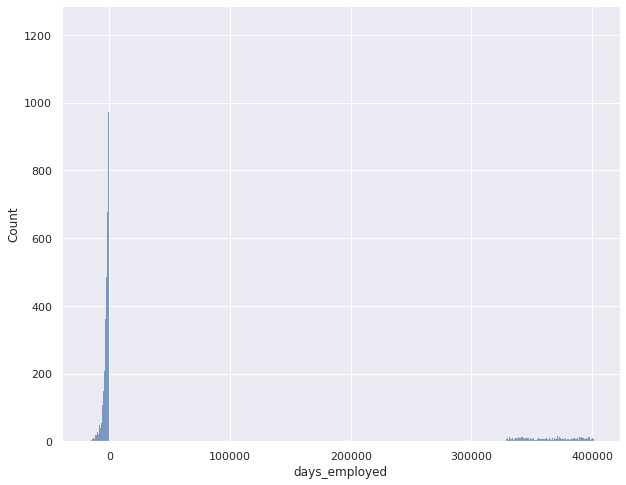

In [532]:
plt.figure(figsize=(10, 8))
sns.histplot(data=data, x='days_employed')
plt.show()

In [533]:
data.days_employed.describe()

count     19350.000000
mean      63049.877623
std      140830.164818
min      -18389.000000
25%       -2747.750000
50%       -1203.000000
75%        -291.000000
max      401755.000000
Name: days_employed, dtype: float64

In [534]:
data[data.days_employed < 0].shape[0]

15905

Больше половины значений признака "days_employed" отрицательные. Предположительно, при сборе данных была допущена ошибка, и они были внесены со знаком "-". Приведём отрицательные значения к абсолютным.

In [535]:
data.days_employed = data.days_employed.abs()

Обработаем пропуски в столбце "income_type" и "days_employed". Предположительно, пропуски в признаках "days_employed" и "income_type" связаны с отсутствием официальных стажа и дохода. <br>
1. Пропуски признака "total_income" заполним с помощью медианного значения по типу дохода и образованию.<br>
2. Пропуски признака "days_employed" заполним с помощью медианного значения стажа в зависимости от возраста.

Перед заменой пропусков требуется обработать аномальные значения признака "dob_years".

In [536]:
fig = px.histogram(data, x='dob_years', marginal='box', template='ggplot2')
fig.update_layout(uniformtext_minsize=12, font_size=16)
fig.show()

В данных 101 клиент с возрастом "0". Это число составляет всего 0.005% от общего количества данных. Избавимся от строк с данным значением.

In [537]:
data = data[data.dob_years != 0]

Создадим сводную таблицу, содержащую информацию о медианной зарплате в зависимости от типа занятости и образования.

In [538]:
income_by_type_ed = pd.pivot_table(data, index=['income_type', 'education'], 
                                   values=['total_income'], aggfunc=['median'])

income_by_type_ed

median
                                    total_income
income_type     education                       
безработный     высшее                  202723.0
                среднее                  59957.0
в декрете       среднее                  53829.0
госслужащий     высшее                  172511.0
                начальное               148339.0
                неоконченное высшее     160592.5
                среднее                 136954.0
                ученая степень          111392.0
компаньон       высшее                  201661.0
                начальное               136799.0
                неоконченное высшее     179300.0
                среднее                 159039.5
пенсионер       высшее                  144240.5
                начальное               102599.0
                неоконченное высшее     120137.0
                среднее                 114890.0
                ученая степень          177088.5
предприниматель высшее                  499163.0
сотрудник       высшее                  165846.0
                начальное               125995.0
                неоконченное высшее     151309.0
                среднее                 136585.0
                ученая степень          198571.0
студент         высшее                   98202.0

Напишем функцию, принимающую строку таблицы в качестве аргумента и возвращающую в случае пропуска медианный доход в зависимости от типа занятости и образования.

In [539]:
def fill_income(row):
    total_income = row['total_income']
    if pd.isnull(total_income):
        income_type = row['income_type']
        education = row['education']
        return income_by_type_ed.loc[income_type, education][0]
    return total_income

data['total_income'] = data.apply(fill_income, axis=1)
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 21369 entries, 0 to 21524
Data columns (total 13 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   children          21369 non-null  int64  
 1   days_employed     19259 non-null  float64
 2   dob_years         21369 non-null  int64  
 3   education         21369 non-null  object 
 4   education_id      21369 non-null  int64  
 5   family_status     21369 non-null  object 
 6   family_status_id  21369 non-null  int64  
 7   gender            21369 non-null  object 
 8   income_type       21369 non-null  object 
 9   debt              21369 non-null  int64  
 10  total_income      21369 non-null  float64
 11  purpose           21369 non-null  object 
 12  category_purpose  21369 non-null  object 
dtypes: float64(2), int64(5), object(6)
memory usage: 2.3+ MB


Теперь обработаем пропуски признака days_employed. Для удобства переведём стаж из дней в годы.

In [540]:
data.days_employed = data.days_employed / 365
data.rename(columns={'days_employed': 'years_employed'}, inplace=True)

In [541]:
fig = px.histogram(data, x='years_employed', marginal='box', 
                   template='ggplot2', nbins=len(data.years_employed.unique()), 
                   title='<b>Распределение признака "years_employed"<b>')
fig.update_layout(uniformtext_minsize=12, font_size=16, height=700, width=1000)
fig.show()

In [542]:
data[data.years_employed > 900]['income_type'].value_counts()

пенсионер      3426
безработный       2
Name: income_type, dtype: int64

In [543]:
pensioners = data[data.income_type == 'пенсионер'].shape[0]
nan_pensioners = data[(data.income_type == 'пенсионер') & (data.years_employed.isnull())].shape[0]
print(f'Количество пенсионеров в наборе данных: {pensioners}')
print(f'Количество пенсионеров с неизвестным стажем: {nan_pensioners}')
print('Количество пенсионеров с аномальным стажем: 3426')

Количество пенсионеров в наборе данных: 3817
Количество пенсионеров с неизвестным стажем: 391
Количество пенсионеров с аномальным стажем: 3426


В наборе данных 3817 пенсионеров. Их них 3426 с аномальным стажем более 900 лет. У остальных 391 стаж неизвестен.
Можно сделать вывод о закономерности некорректных данных о стаже пенсионеров. <br>
Аномальные и пропущенные значения стажа заменим его медианным значением в зависимости от возраста.

In [544]:
true_years_employed = data[data.years_employed < 100]
experience_by_years = true_years_employed.groupby('dob_years')['years_employed'].median()

def fix_years_employed(row):
    years_employed = row['years_employed']
    dob_years = row['dob_years']
    if years_employed > 100 or pd.isnull(years_employed):
        return experience_by_years[dob_years]
    return years_employed

data['years_employed'] = data.apply(fix_years_employed, axis=1)

### Поиск выбросов и аномальных значений

Для оценки распределений признаков будем использовать гистограммы и диаграммы размаха.

In [545]:
fig = px.histogram(data, x='total_income', marginal='box', template='ggplot2', 
                   title='<b>Распределение признака "total_income"<b>')
fig.update_layout(uniformtext_minsize=12, font_size=16, height=700, width=1000)
fig.show()

Среди значений дохода клиентов присутствуют сильно отличающиеся от остальных значения больше 1 млн. Они не являются выбросами или аномальными значениями, поэтому удалять их не будем.

In [546]:
fig = px.histogram(data, x='dob_years', marginal='box', template='ggplot2', 
                   title='<b>Распределение признака "dob_years"<b>')
fig.update_layout(uniformtext_minsize=12, font_size=16, height=700, width=1000)
fig.show()

In [547]:
fig = px.histogram(data, x='children', marginal='box', template='ggplot2', 
                   title='<b>Распределение признака "children"<b>')
fig.update_layout(uniformtext_minsize=12, font_size=16, height=700, width=1000)
fig.show()

Обнаружены 2 аномальных значения: -1 и 20. <br>
Значение "-1", вероятнее всего, было получено в результате опечатки при внесении данных. Заменим данное значение на "1". <br>
Значение "20" теоретически возможно, вероятность получить в выборке клиентов одного из банков 21 семью с 20 детьми практически невозможно. К тому, же среди клиентов с таким количеством детей есть люди младше 30 лет. Возможно, в результате опечатки вместо значения "2" появилось "20".

In [548]:
data.loc[data.children == -1, 'children'] = 1
data.loc[data.children == 20, 'children'] = 2

In [549]:
fig = px.histogram(data, x='years_employed', marginal='box', template='ggplot2', 
                   title='<b>Распределение признака "years_employed"<b>')
fig.update_layout(uniformtext_minsize=12, font_size=16, height=700, width=1000)
fig.show()

Для определения выбросов нужно взять стаж с учётом возраста. Согласно Трудовому кодексу РФ, официально трудоустроиться может лицо, достигшее 14 лет. Поэтому максимально возможный стаж: возраст - 14.

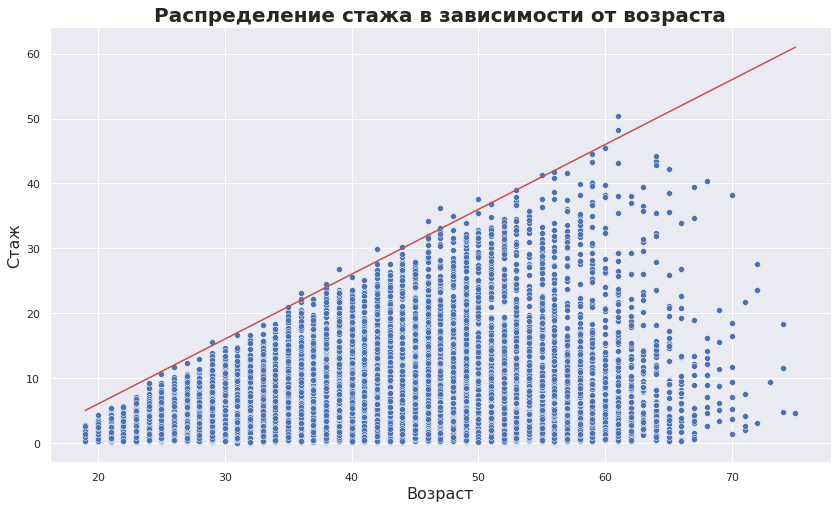

In [550]:
sorted_years = np.sort(data.dob_years.unique())
max_years_employee = [(year - 14) for year in sorted_years]

plt.figure(figsize=(14, 8))
sns.scatterplot(data=data, x='dob_years', y='years_employed')
sns.lineplot(x=sorted_years, y=max_years_employee, color='r')

plt.xlabel('Возраст', fontsize=16)
plt.ylabel('Стаж', fontsize=16)
plt.title('Распределение стажа в зависимости от возраста', 
          fontdict={'fontsize': 20, 'fontweight':'bold'})
plt.show()

Значения выше красной линии являются невозможными, т.к стаж с учётом возраста првевышает теоретически возможные значения. Эти значения стажа будут исправлены на максимально возможные с учётом возраста.

In [551]:
max_years_emp = dict(zip(sorted_years, max_years_employee))

def fix_years_employed(row):
    age = row['dob_years']
    experience = row['years_employed']
    if experience > max_years_emp[age]:
        return max_years_emp[age]
    return experience

data['years_employed'] = data.apply(fix_years_employed, axis=1)

In [552]:
fig = px.histogram(data, x='education', template='ggplot2', 
                   title='<b>Распределение признака "education"<b>')
fig.update_layout(uniformtext_minsize=12, font_size=16, height=700, width=1000)
fig.show()

In [553]:
fig = px.histogram(data, x='family_status', template='ggplot2', 
                   title='<b>Распределение признака "family_status"<b>')
fig.update_layout(uniformtext_minsize=12, font_size=16, height=700, width=1000)
fig.show()

In [554]:
fig = px.histogram(data, x='category_purpose', template='ggplot2', 
                   title='<b>Распределение признака "category_purpose"<b>')
fig.update_layout(uniformtext_minsize=12, font_size=16, height=700, width=1000)
fig.show()

In [555]:
fig = px.histogram(data, x='income_type', template='ggplot2', 
                   title='<b>Распределение признака "category_purpose"<b>')
fig.update_layout(uniformtext_minsize=12, font_size=16, height=700, width=1000)
fig.show()

<a id="id3"></a>
## 3. Исследовательский анализ данных

In [556]:
corrs = data.corr()
ff.create_annotated_heatmap(
    z=corrs.values,
    x=list(corrs.columns),
    y=list(corrs.index),
    annotation_text=np.around(corrs.values, decimals=2),
    showscale=True)

### 3.1 Влияние признаков на целевую переменную

Изучим влияние каждого признака в отдельности на вероятность того, что клиент в срок исполнит свои долговые обязательства.

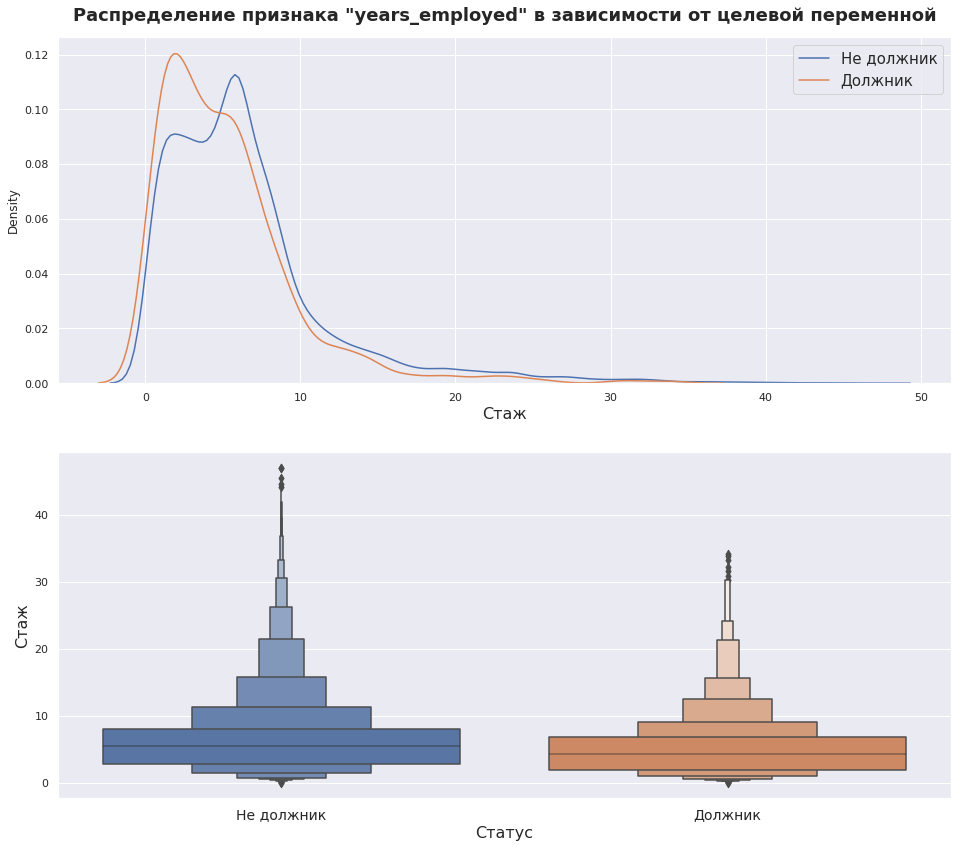

Разница между медианными значениями составляет 0.22%


In [557]:
fig, ax = plt.subplots(2, 1, figsize=(16, 14))
sns.kdeplot(data=data[data.debt == 0], x='years_employed', 
            label='Не должник', ax=ax[0])
sns.kdeplot(data=data[data.debt == 1], x='years_employed', 
            label='Должник', ax=ax[0])
sns.boxenplot(data=data, x='debt', y='years_employed', ax=ax[1])

ax[0].set_xlabel('Стаж', fontsize=16)
ax[1].set_xlabel('Статус', fontsize=16)
ax[1].set_ylabel('Стаж', fontsize=16)

ax[1].set_xticklabels(['Не должник', 'Должник'], size = 14)

ax[0].set_title('Распределение признака "years_employed" в зависимости от целевой переменной', 
                fontdict={'fontsize': 18, 'fontweight':'bold'}, y=1.03)

ax[0].legend(fontsize=15)
plt.show()

diff_medians = (data[data.debt == 0].years_employed.median() - 
                data[data.debt == 1].years_employed.median()) / \
                data[data.debt == 0].years_employed.median()
print(f'Разница между медианными значениями составляет {round(diff_medians, 2)}%')

**Медианное значение официального стажа для должников меньше. Следовательно, клиенты с меньшим стажем с большей вероятностью не смогут в срок выполнить долговые обязательства. <br>
Стоит отметить, что среди должников нет клиентов со стажем более 35 лет.**

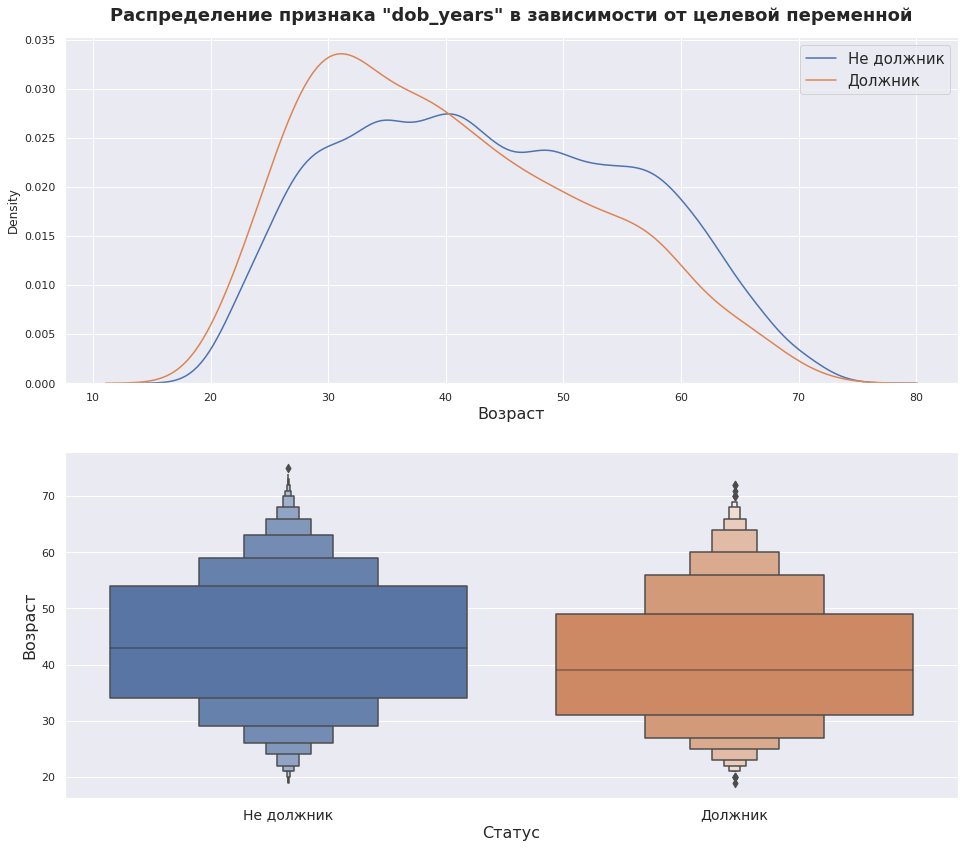

Разница между медианными значениями составляет 0.09%


In [558]:
fig, ax = plt.subplots(2, 1, figsize=(16, 14))
sns.kdeplot(data=data[data.debt == 0], x='dob_years', 
            label='Не должник', ax=ax[0])
sns.kdeplot(data=data[data.debt == 1], x='dob_years', 
            label='Должник', ax=ax[0])
sns.boxenplot(data=data, x='debt', y='dob_years', ax=ax[1])

ax[0].set_xlabel('Возраст', fontsize=16)
ax[1].set_xlabel('Статус', fontsize=16)
ax[1].set_ylabel('Возраст', fontsize=16)

ax[1].set_xticklabels(['Не должник', 'Должник'], size = 14)

ax[0].set_title('Распределение признака "dob_years" в зависимости от целевой переменной', 
                fontdict={'fontsize': 18, 'fontweight':'bold'}, y=1.03)

ax[0].legend(fontsize=15)
plt.show()

diff_medians = (data[data.debt == 0].dob_years.median() - 
                data[data.debt == 1].dob_years.median()) / \
                data[data.debt == 0].dob_years.median()
print(f'Разница между медианными значениями составляет {round(diff_medians, 2)}%')

**Медианный возраст должника на 9% меньше. <br>
Можно сделать вывод, что возраст незначительно влияет на вероятность своевременной оплаты долга. Стоит не забывать о возможной взаимосвязи возраста и официального стажа.**

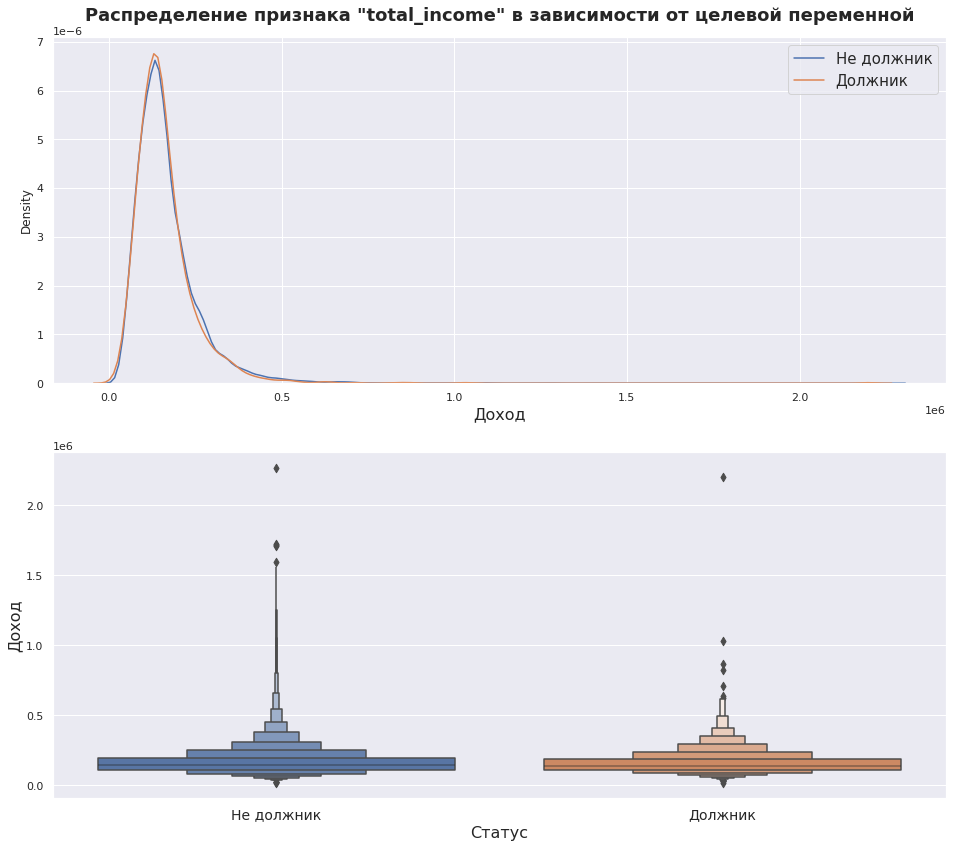

Разница между медианными значениями составляет 0.03%


In [559]:
fig, ax = plt.subplots(2, 1, figsize=(16, 14))
sns.kdeplot(data=data[data.debt == 0], x='total_income', 
            label='Не должник', ax=ax[0])
sns.kdeplot(data=data[data.debt == 1], x='total_income', 
            label='Должник', ax=ax[0])
sns.boxenplot(data=data, x='debt', y='total_income', ax=ax[1])

ax[0].set_xlabel('Доход', fontsize=16)
ax[1].set_xlabel('Статус', fontsize=16)
ax[1].set_ylabel('Доход', fontsize=16)

ax[1].set_xticklabels(['Не должник', 'Должник'], size = 14)

ax[0].set_title('Распределение признака "total_income" в зависимости от целевой переменной', 
                fontdict={'fontsize': 18, 'fontweight':'bold'}, y=1.03)

ax[0].legend(fontsize=15)
plt.show()

diff_medians = (data[data.debt == 0].total_income.median() - 
                data[data.debt == 1].total_income.median()) / \
                data[data.debt == 0].total_income.median()
print(f'Разница между медианными значениями составляет {round(diff_medians, 2)}%')

**Распределения уровня дохода у должников и не должников очень похожи. Медианы практически не отличаются. <br>
Стоит заметить, что среди клиентов, выполняющих в срок долговые обязательства, имеющих очень высокий доход, больше, чем среди должников.**

In [560]:
data.debt = data.debt.map({0: 'Не должник', 1: 'Должник'})

In [561]:
debt_by_education = pd.crosstab(index=data.education, columns=data.debt)
debt_by_education['Должник'] = round(debt_by_education['Должник'] / debt_by_education['Должник'].sum(), 3)
debt_by_education['Не должник'] = round(debt_by_education['Не должник'] / debt_by_education['Не должник'].sum(), 4)

fig = go.Figure()
trace_1 = go.Bar(x=debt_by_education.index, y=debt_by_education['Должник'], 
                 name='Должник', text=debt_by_education['Должник'], textposition="outside")
trace_2 = go.Bar(x=debt_by_education.index, y=debt_by_education['Не должник'], 
                 name='Не должник', text=debt_by_education['Не должник'], textposition="outside")
fig.add_trace(trace_1)
fig.add_trace(trace_2)

fig.update_xaxes(title='Образование')
fig.update_yaxes(title='Количество, %')

fig.update_layout(uniformtext_minsize=12, font_size=16, template='ggplot2', 
                  height=800, width=950, legend=dict(x=0, y=1), 
                  title='<b>Соотношение долгового статуса и образования<b>')
fig.show()

**1. В более, чем 70% случаев кредитными услугами пользуются люди со средним образованием. Реже всех услугами банка пользуются люди с учёной степенью. <br>
2. Клиенты со средним образованием чаще оказываются чаще оказываются должниками, в отличие от клиентов с высшим образованием.**

In [562]:
debt_by_family = pd.crosstab(index=data.family_status, columns=data.debt)
debt_by_family['Должник'] = round(debt_by_family['Должник'] / debt_by_family['Должник'].sum(), 3)
debt_by_family['Не должник'] = round(debt_by_family['Не должник'] / debt_by_family['Не должник'].sum(), 4)

fig = go.Figure()
trace_1 = go.Bar(x=debt_by_family.index, y=debt_by_family['Должник'], 
                 name='Должник', text=debt_by_family['Должник'], textposition="outside")
trace_2 = go.Bar(x=debt_by_family.index, y=debt_by_family['Не должник'], 
                 name='Не должник', text=debt_by_family['Не должник'], textposition="outside")
fig.add_trace(trace_1)
fig.add_trace(trace_2)

fig.update_xaxes(title='Cемейный статус')
fig.update_yaxes(title='Количество, %')

fig.update_layout(uniformtext_minsize=12, font_size=16, template='ggplot2', 
                  height=800, width=950, legend=dict(x=0, y=1), 
                  title='<b>Соотношение семейного и долгового статуса<b>')
fig.show()

**1. Чаще всех пользуются кредитными услугами клиенты, состоящие в официально зарегистрированном браке. Реже всех - вдовцы и вдовы; <br>
2. Чаще оказываются должниками холостые и в гражданском браке.**

In [563]:
debt_by_gender = pd.crosstab(index=data.gender, columns=data.debt)
debt_by_gender['Должник'] = round(debt_by_gender['Должник'] / debt_by_gender['Должник'].sum(), 3)
debt_by_gender['Не должник'] = round(debt_by_gender['Не должник'] / debt_by_gender['Не должник'].sum(), 4)

fig = go.Figure()
trace_1 = go.Bar(x=debt_by_gender.index, y=debt_by_gender['Должник'], 
                 name='Должник', text=debt_by_gender['Должник'], textposition="outside")
trace_2 = go.Bar(x=debt_by_gender.index, y=debt_by_gender['Не должник'], 
                 name='Не должник', text=debt_by_gender['Не должник'], textposition="outside")
fig.add_trace(trace_1)
fig.add_trace(trace_2)

fig.update_xaxes(title='Пол')
fig.update_yaxes(title='Количество, %')

fig.update_layout(uniformtext_minsize=12, font_size=16, template='ggplot2', 
                  height=800, width=950, legend=dict(x=0, y=1), 
                  title='<b>Соотношение долгового статуса и гендера<b>')
fig.show()

**1. Женщины чаще пользуются кредитными продуктами; <br>
2. Мужчины чаще оказываются должниками.**

In [564]:
debt_by_type = pd.crosstab(index=data.income_type, columns=data.debt)
debt_by_type['Должник'] = round(debt_by_type['Должник'] / debt_by_type['Должник'].sum(), 3)
debt_by_type['Не должник'] = round(debt_by_type['Не должник'] / debt_by_type['Не должник'].sum(), 4)

fig = go.Figure()
trace_1 = go.Bar(x=debt_by_type.index, y=debt_by_type['Должник'], 
                 name='Должник', text=debt_by_type['Должник'], textposition="outside")
trace_2 = go.Bar(x=debt_by_type.index, y=debt_by_type['Не должник'], 
                 name='Не должник', text=debt_by_type['Не должник'], textposition="outside")
fig.add_trace(trace_1)
fig.add_trace(trace_2)

fig.update_xaxes(title='Тип занятости')
fig.update_yaxes(title='Количество, %')

fig.update_layout(uniformtext_minsize=12, font_size=16, template='ggplot2', 
                  height=800, width=950, legend=dict(x=0, y=1), 
                  title='<b>Соотношение долгового статуса и типа занятости<b>')
fig.show()

**1. Чаще всех кредитными продуктами пользуются сотрудники. Реже всех - безработные, предприниматели и студенты;<br>
2.  Сотрудники чаще всех оказываются должниками.**

In [565]:
debt_by_purpose = pd.crosstab(index=data.category_purpose, columns=data.debt)
debt_by_purpose['Должник'] = round(debt_by_purpose['Должник'] / debt_by_purpose['Должник'].sum(), 3)
debt_by_purpose['Не должник'] = round(debt_by_purpose['Не должник'] / debt_by_purpose['Не должник'].sum(), 4)

fig = go.Figure()
trace_1 = go.Bar(x=debt_by_purpose.index, y=debt_by_purpose['Должник'], 
                 name='Должник', text=debt_by_purpose['Должник'], textposition="outside")
trace_2 = go.Bar(x=debt_by_purpose.index, y=debt_by_purpose['Не должник'], 
                 name='Не должник', text=debt_by_purpose['Не должник'], textposition="outside")
fig.add_trace(trace_1)
fig.add_trace(trace_2)

fig.update_xaxes(title='Цель кредита')
fig.update_yaxes(title='Количество, %')

fig.update_layout(uniformtext_minsize=12, font_size=16, template='ggplot2', 
                  height=800, width=950, legend=dict(x=0, y=1), 
                  title='<b>Соотношение долгового статуса и цели кредита<b>')
fig.show()

**1. Чаще всех кредитные услуги используют для покупки недвижимости. Реже всех - для свадьбы; <br>
2. Должниками чаще оказываются клиенты, оформившие кредит на втомобиль и образование.**

### 3.2 Анализ зависимостей между предикторами

## Построение модели

In [567]:
numerical = ['years_employed', 'children', 'dob_years', 'total_income']
categorical = ['education', 'family_status', 'gender', 'income_type', 'category_purpose']


def data_preparation(data, numerical, categorical):
    scaler = preprocessing.StandardScaler()
    data[numerical] = scaler.fit_transform(data[numerical])
    data = pd.get_dummies(data, columns=categorical, drop_first=True)
    features = data.drop(columns=['debt'])
    target = data['debt']
    return features, target

features, target = data_preparation(data=data, numerical=numerical, categorical=categorical)
features

,children,years_employed,dob_years,education_id,family_status_id,total_income,purpose,education_начальное,education_неоконченное высшее,education_среднее,...,income_type_в декрете,income_type_госслужащий,income_type_компаньон,income_type_пенсионер,income_type_предприниматель,income_type_сотрудник,income_type_студент,category_purpose_недвижимость,category_purpose_образование,category_purpose_свадьба
0,0.687909,3.018619,-0.121233,0,0,0.898781,покупка жилья,0,0,0,...,0,0,0,0,0,1,0,1,0,0
1,0.687909,0.832884,-0.611217,1,0,-0.542755,приобретение автомобиля,0,0,1,...,0,0,0,0,0,1,0,0,0,0
2,-0.635455,1.624365,-0.856209,1,0,-0.199074,покупка жилья,0,0,1,...,0,0,0,0,0,1,0,1,0,0
3,3.334636,0.882414,-0.937873,1,0,1.038598,дополнительное образование,0,0,1,...,0,0,0,0,0,1,0,0,1,0
4,-0.635455,-0.045025,0.777071,1,1,-0.069657,сыграть свадьбу,0,0,1,...,0,0,0,1,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21520,0.687909,1.082513,-0.039569,1,1,0.603105,операции с жильем,0,0,1,...,0,0,1,0,0,0,0,1,0,0
21521,-0.635455,-0.197328,1.920366,1,0,-0.096252,сделка с автомобилем,0,0,1,...,0,0,0,1,0,0,0,0,0,0
21522,0.687909,-0.114119,-0.447889,1,1,-0.770550,недвижимость,0,0,1,...,0,0,0,0,0,1,0,1,0,0
21523,3.334636,0.380681,-0.447889,1,0,0.799325,на покупку своего автомобиля,0,0,1,...,0,0,0,0,0,1,0,0,0,0


In [569]:
X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.25, random_state=0)